<a href="https://colab.research.google.com/github/rohitcricket/TensorFlow2.0-DreamDeepArtWithAI/blob/master/DreamingWithAI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Dreaming Deeply with AI**

Deep dream is a computer vision algorithm created by Alexander Mordvintsev from Google.
The algorithm works by creating dream-like effect. It’s like giving humans an extremely powerful drug!
When you feed in an image to a trained ANN, the neurons fire and generate activations. The deep dream algorithm work by trying to change the input image in a way that would make some of these neurons fire more (boost the neurons firing or activations).
You can select which neurons in which layer you are interested in making them fire more prominently.
The process is continuously repeated until the input image now contains all features that a specific layer was originally looking for.
Example: if a certain layer was expert in recognizing dog faces and you feed in an image of a blue sky, the deep dream algorithm will continuously change the input image and start creating images of dogs faces on top of the blue sky. The process keep repeating until the layer of interest is happy with the results!
Deep Dream Steps:
Forward an image through a trained ANN, CNN, ResNet..etc
Select a layer of choice (first layers capture edges, deep layers capture full shapes such as faces)
Calculate the activations (output) coming out from the layer of interest.
Calculate the gradient of the activations with respect to the input image
Modify the image to increase these activations, and thus enhance the patterns seen by the network resulting in trippy hallucinated image!
Iterate and repeat over multiple scales
This code is adapted from Tensorflow 2.0 Documentation: https://www.tensorflow.org/beta/tutorials/generative/deepdream

## **Step 1: Import Libraries**

In [1]:
!pip install tensorflow-gpu==2.0.0

In [0]:
import tensorflow as tf

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random 

In [3]:
tf.__version__

'2.0.0'

## **Step 2: Import Pre-Trained Weights**

Downloading model from Google! Inception Net is already trained with images.

In [0]:
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

In [5]:
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, None, None, 3 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, None, None, 3 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, None, None, 3 0           batch_normalization[0][0]        
_______________________________________________________________________________________


*   The objective of this function is to select a layer and attempt at maximizing the loss which is the activations generated by the layer of interest.
*   We can select any layer we choose, early layers generate simple 
features such as edges and deep layers generate more complex features such as entire face, car or tree.
*   Inception network has multiple concatenated layers named 'mixed'

In [0]:
# Maximize the activations of these layers
# names = ['mixed8', 'mixed9']

# names = ['mixed3', 'mixed5', 'mixed8', 'mixed9']
names = ['mixed3', 'mixed5'] # Selected mixed3 and mixed5
# names = ['mixed5']

layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
deepdream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

## **Step 3: Import drive; preprocess an Image**

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [0]:
Sample_Image= tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/Colab Notebooks/StaryNight.jpg', target_size = (225, 375))

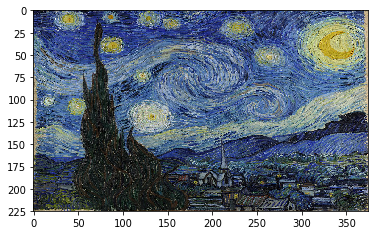

In [9]:
plt.imshow(Sample_Image)

In [10]:
np.shape(Sample_Image)

(225, 375, 3)

In [11]:
# Normalize the input image

Sample_Image = np.array(Sample_Image)/255.0
Sample_Image.shape

(225, 375, 3)

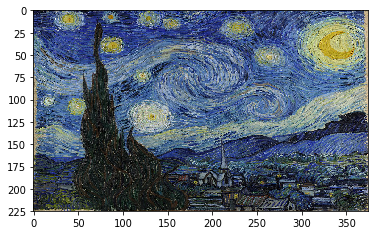

In [12]:
plt.imshow(Sample_Image)

In [13]:
# Let's make sure that the image in fact normalized!
Sample_Image.max()

1.0

In [14]:
Sample_Image.min()

0.0

## **Run pretrained model and explore Activation Factors**

In [15]:
Sample_Image = tf.keras.preprocessing.image.img_to_array(Sample_Image)
Sample_Image.shape

(225, 375, 3)

Batch format

In [16]:
Sample_Image = tf.expand_dims(Sample_Image, axis = 0)
np.shape(Sample_Image)

TensorShape([1, 225, 375, 3])

In [17]:
# Let's run the model by feeding in our input image and taking a look at the activations "Neuron outputs"
activations = deepdream_model(Sample_Image)
activations

[<tf.Tensor: id=11104, shape=(1, 12, 21, 768), dtype=float32, numpy=
 array([[[[0.        , 0.85610944, 0.        , ..., 1.4818763 ,
           0.22237563, 0.35940912],
          [1.2307605 , 0.        , 0.5454623 , ..., 0.76856834,
           0.18145025, 0.35940912],
          [1.4202741 , 0.        , 0.01476347, ..., 1.623953  ,
           0.7639262 , 0.11698437],
          ...,
          [1.0687127 , 0.        , 0.        , ..., 1.5488162 ,
           1.2187147 , 0.19697747],
          [1.1275918 , 0.        , 0.05522043, ..., 1.5488162 ,
           1.2187147 , 0.        ],
          [1.3096492 , 0.        , 0.13410991, ..., 1.3475924 ,
           0.8825256 , 0.18855429]],
 
         [[0.        , 0.        , 0.        , ..., 0.47122985,
           0.        , 0.4458193 ],
          [0.        , 0.74698013, 0.        , ..., 0.76856834,
           0.        , 0.27167478],
          [0.        , 0.        , 0.        , ..., 0.76856834,
           0.        , 0.11698437],
          ...

In [18]:
len(activations)

2

In [0]:
# print(np.shape(activations))

## **Deep Dream Loss Calculations**

The objective of this function is to select a layer and attempt at maximizing the loss which is the activations generated by the layer of interest.
We can select any layer we choose, early layers generate simple features such as edges and deep layers generate more complex features such as entire face, car or tree.
Inception network has multiple concatenated layers named 'mixed', you can select any layer or more from mixed0 to mixed10.
We will calculate the loss which represents the sum of activations for a given layer.
Most of the time we wanted to minimize the loss 'error' via gradient descent, however, in deep dream we are going to maximize the loss!!
This is done by perforing gradient 'ascent' and not gradient 'descent'.

In [0]:
def calc_loss(image, model):
# Function used for loss calculations
# It works by feedforwarding the input image through the network and generate activations
# Then obtain the average and sum of those outputs

  img_batch = tf.expand_dims(image, axis=0) # Convert into batch format
  layer_activations = model(img_batch) # Run the model
  print('ACTIVATION VALUES (LAYER OUTPUT) =\n', layer_activations)
  # print('ACTIVATION SHAPE =\n', np.shape(layer_activations))

  losses = [] # accumulator to hold all the losses
  for act in layer_activations:
    loss = tf.math.reduce_mean(act) # calculate mean of each activation 
    losses.append(loss)
  
  print('LOSSES (FROM MULTIPLE ACTIVATION LAYERS) = ', losses)
  print('LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) = ', np.shape(losses))
  print('SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)= ', tf.reduce_sum(losses))

  return  tf.reduce_sum(losses) # Calculate sum 

In [21]:
# Let's test the function
Sample_Image= tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/Colab Notebooks/StaryNight.jpg', target_size = (225, 375))
Sample_Image = np.array(Sample_Image)/255.0
Sample_Image = tf.keras.preprocessing.image.img_to_array(Sample_Image)
Sample_Image = tf.Variable(tf.keras.applications.inception_v3.preprocess_input(Sample_Image))

loss = calc_loss(Sample_Image, deepdream_model)

ACTIVATION VALUES (LAYER OUTPUT) =
 [<tf.Tensor: id=11784, shape=(1, 12, 21, 768), dtype=float32, numpy=
array([[[[0.        , 0.6254948 , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.6352269 , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.02112859, 0.        , ..., 0.        ,
          0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ]],

        [[0.        , 0.00612307, 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.1348396 , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        

In [22]:
loss # Sum up the losses from both activations

<tf.Tensor: id=12068, shape=(), dtype=float32, numpy=0.4407277>

## **Step 5: Calculate the Gradient ASCENT Calculations**

In this step, we will rely on the loss that has been calculated in the previous step and calculate the gradient with respect to the given input image and then add it to the input original image.
Doing so iteratively will result in feeding images that continiously and increasingly excite the neurons and generate more dreamy like images!
Check out the Appendix for more info on tf.gradienttape()

In [0]:
@tf.function
def deepdream(model, image, step_size):
    with tf.GradientTape() as tape:
      # This needs gradients relative to `img`
      # `GradientTape` only watches `tf.Variable`s by default
      tape.watch(image)
      loss = calc_loss(image, model) # call the function that calculate the loss 

    # Calculate the gradient of the loss with respect to the pixels of the input image.
    # The syntax is as follows: dy_dx = g.gradient(y, x) 
    gradients = tape.gradient(loss, image)

    print('GRADIENTS =\n', gradients)
    print('GRADIENTS SHAPE =\n', np.shape(gradients))

    # tf.math.reduce_std computes the standard deviation of elements across dimensions of a tensor
    gradients /= tf.math.reduce_std(gradients)  

    # In gradient ascent, the "loss" is maximized so that the input image increasingly "excites" the layers.
    # You can update the image by directly adding the gradients (because they're the same shape!)
    image = image + gradients * step_size
    image = tf.clip_by_value(image, -1, 1)

    return loss, image

In [0]:
def run_deep_dream_simple(model, image, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  image = tf.keras.applications.inception_v3.preprocess_input(image)

  for step in range(steps):
    loss, image = deepdream(model, image, step_size)
    
    if step % 100 == 0:
      plt.figure(figsize=(12,12))
      plt.imshow(deprocess(image))
      plt.show()
      print ("Step {}, loss {}".format(step, loss))

  # clear_output(wait=True)
  plt.figure(figsize=(12,12))
  plt.imshow(deprocess(image))
  plt.show()

  return deprocess(image)

In [0]:
def deprocess(image):
  image = 255*(image + 1.0)/2.0
  return tf.cast(image, tf.uint8)

ACTIVATION VALUES (LAYER OUTPUT) =
 [<tf.Tensor 'model/mixed3/concat:0' shape=(1, 12, 21, 768) dtype=float32>, <tf.Tensor 'model/mixed5/concat:0' shape=(1, 12, 21, 768) dtype=float32>]
LOSSES (FROM MULTIPLE ACTIVATION LAYERS) =  [<tf.Tensor 'Mean:0' shape=() dtype=float32>, <tf.Tensor 'Mean_1:0' shape=() dtype=float32>]
LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) =  (2,)
SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)=  Tensor("Sum:0", shape=(), dtype=float32)
GRADIENTS =
 Tensor("Reshape_3:0", shape=(225, 375, 3), dtype=float32)
GRADIENTS SHAPE =
 (225, 375, 3)


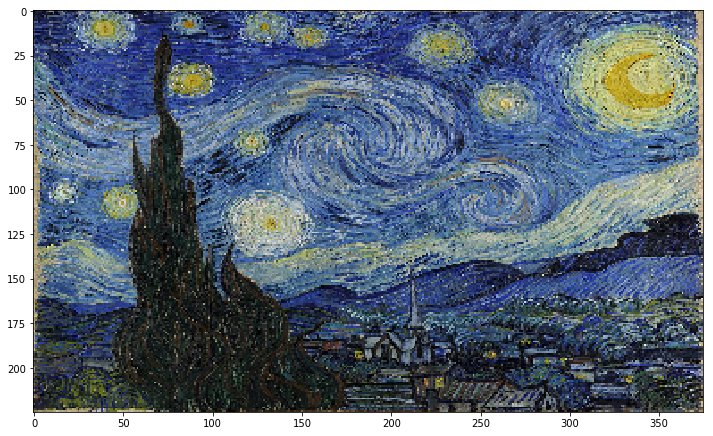

Step 0, loss 0.6168044805526733


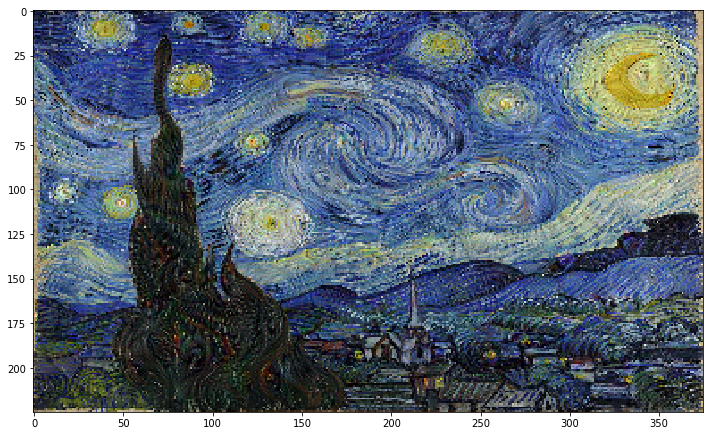

Step 100, loss 1.4088642597198486


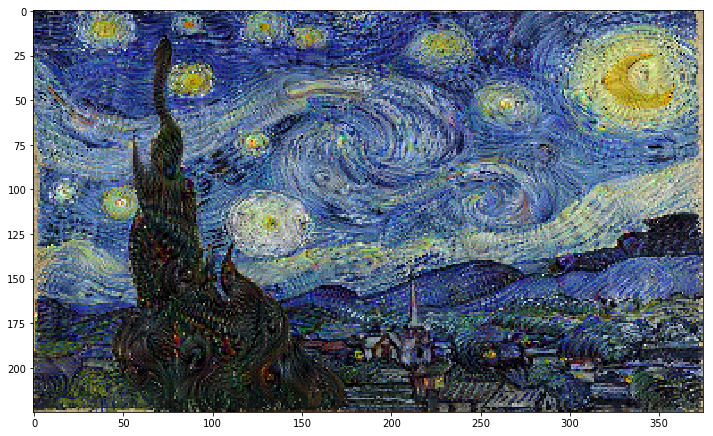

Step 200, loss 1.719771385192871


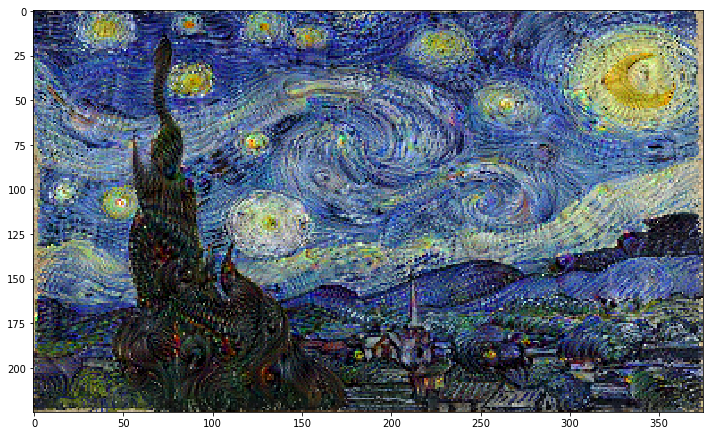

Step 300, loss 1.9056260585784912


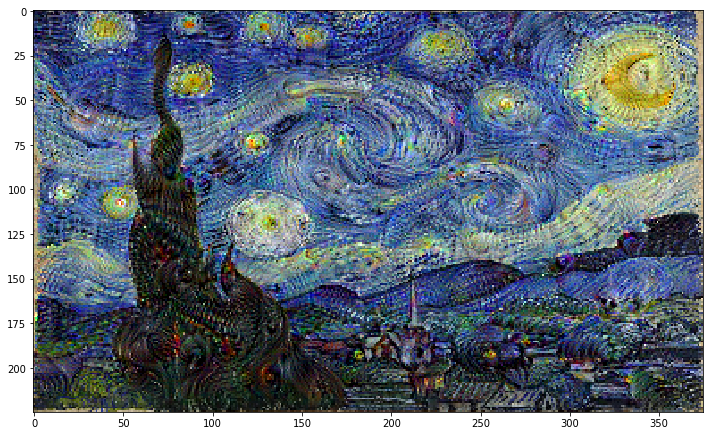

Step 400, loss 2.0436899662017822


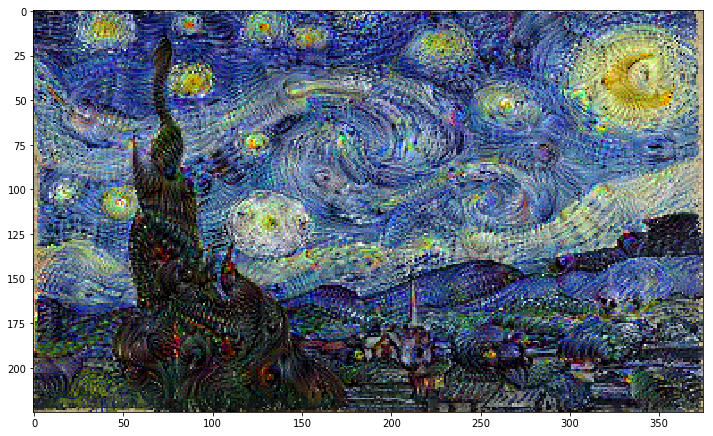

Step 500, loss 2.153639793395996


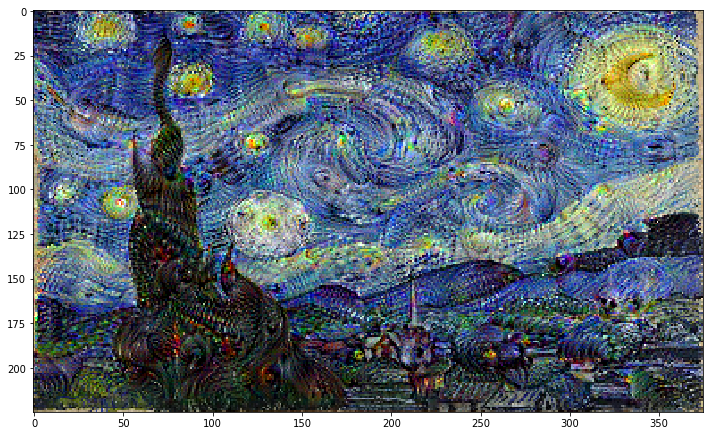

Step 600, loss 2.2464711666107178


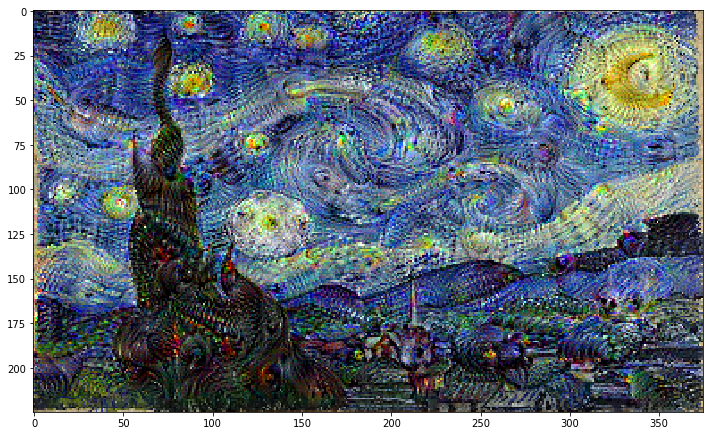

Step 700, loss 2.3270750045776367


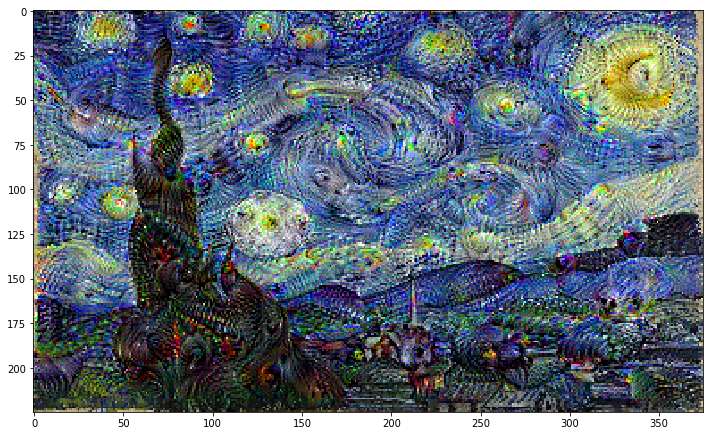

Step 800, loss 2.3985443115234375


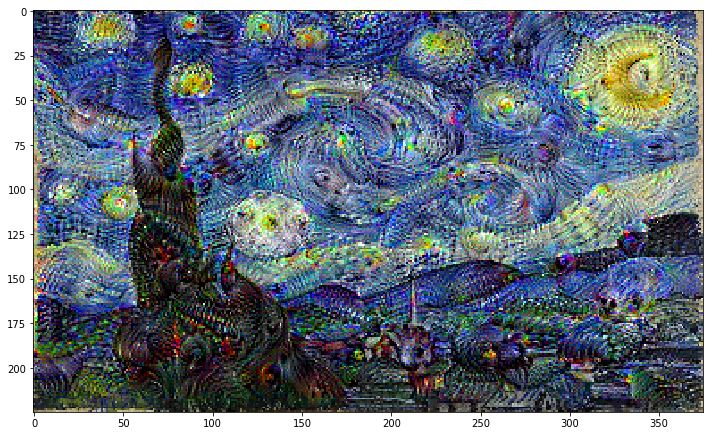

Step 900, loss 2.463615655899048


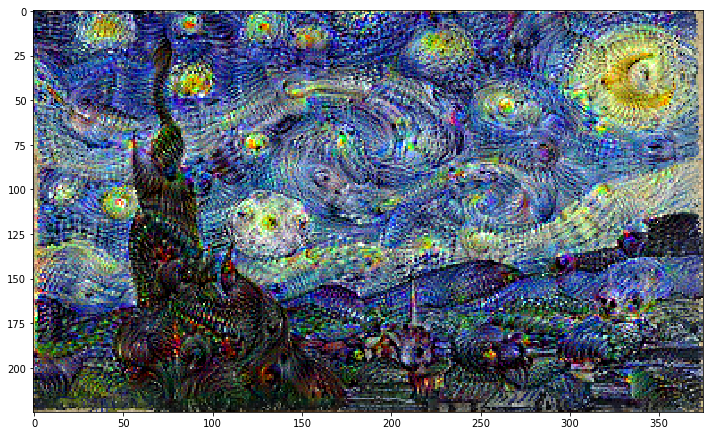

Step 1000, loss 2.524418830871582


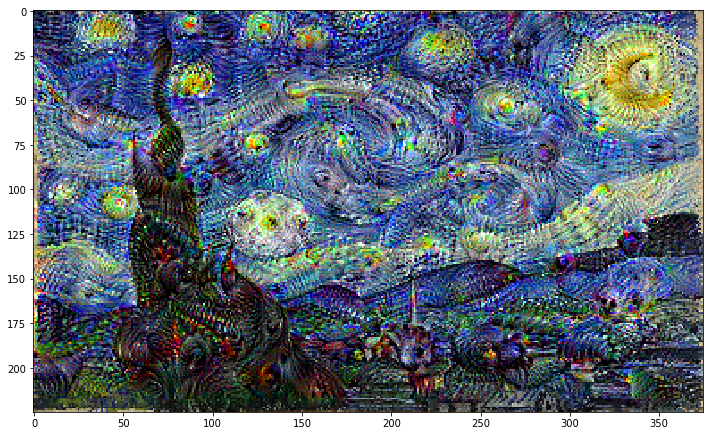

Step 1100, loss 2.5814390182495117


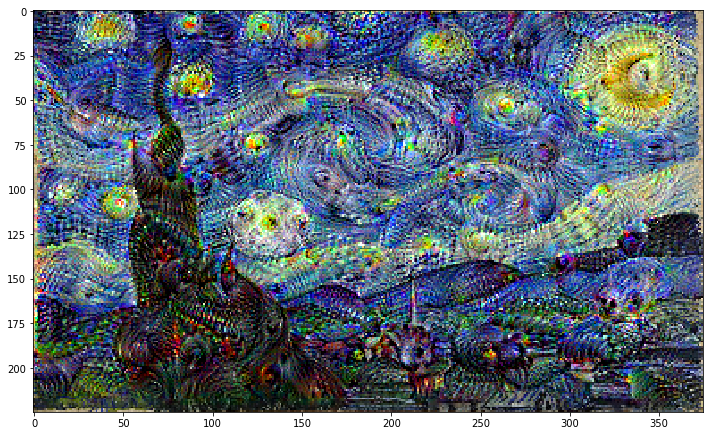

Step 1200, loss 2.634693145751953


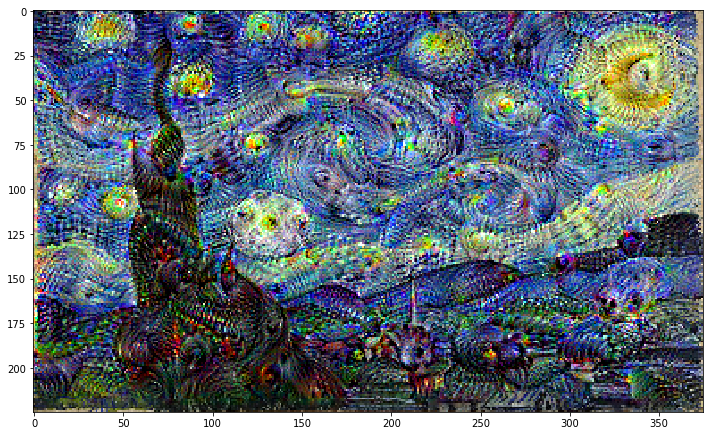

Step 1300, loss 2.684589147567749


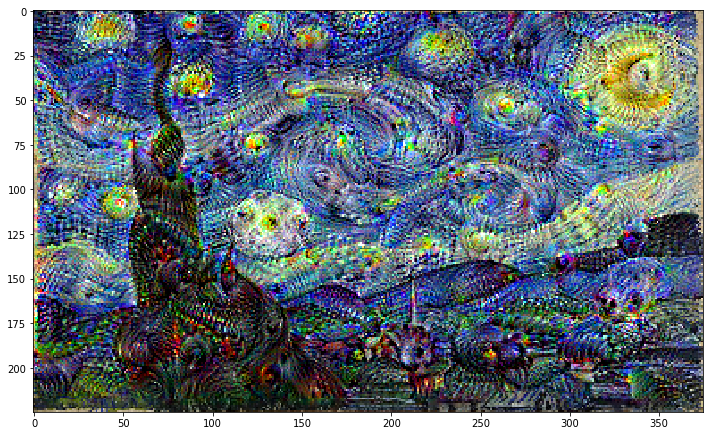

Step 1400, loss 2.733330726623535


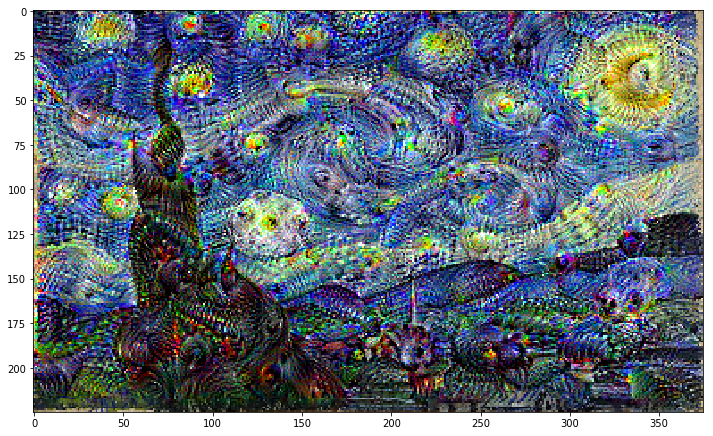

Step 1500, loss 2.780627727508545


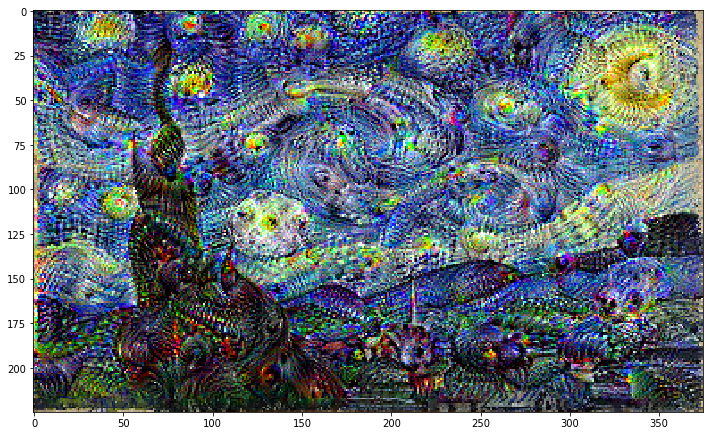

Step 1600, loss 2.82554292678833


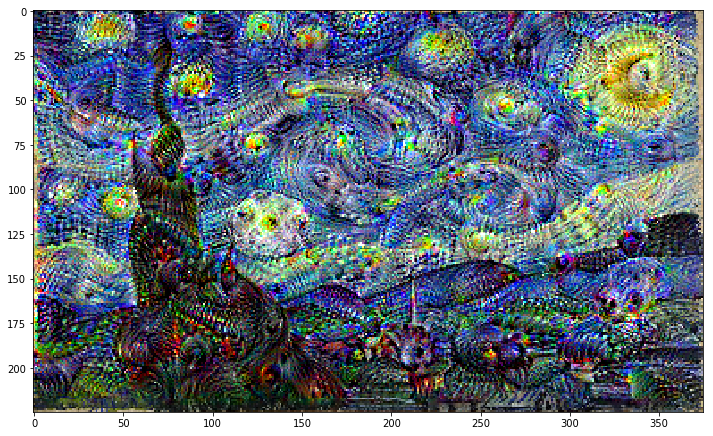

Step 1700, loss 2.8689470291137695


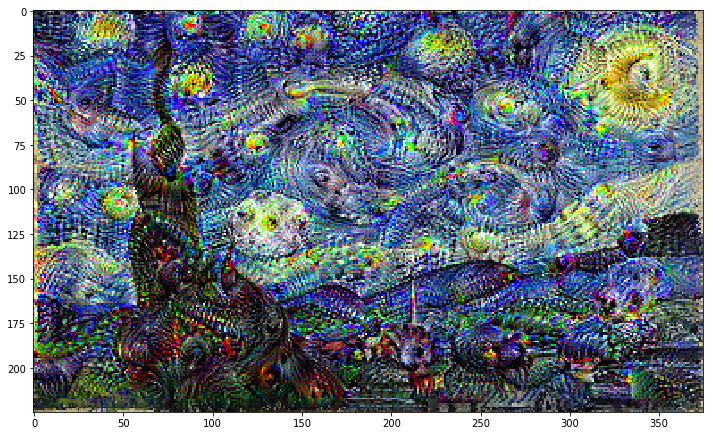

Step 1800, loss 2.9105467796325684


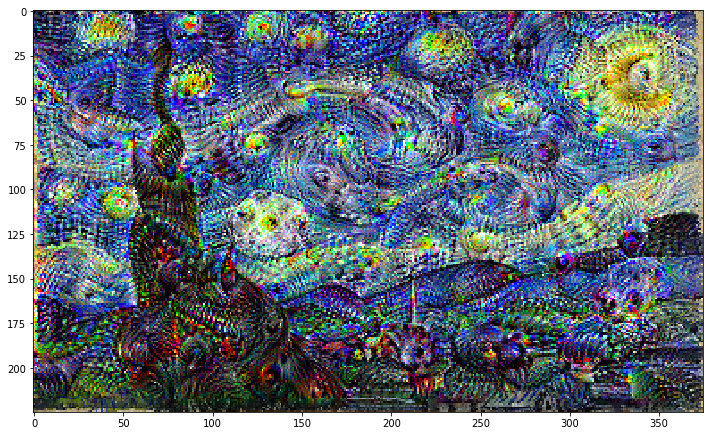

Step 1900, loss 2.9502739906311035


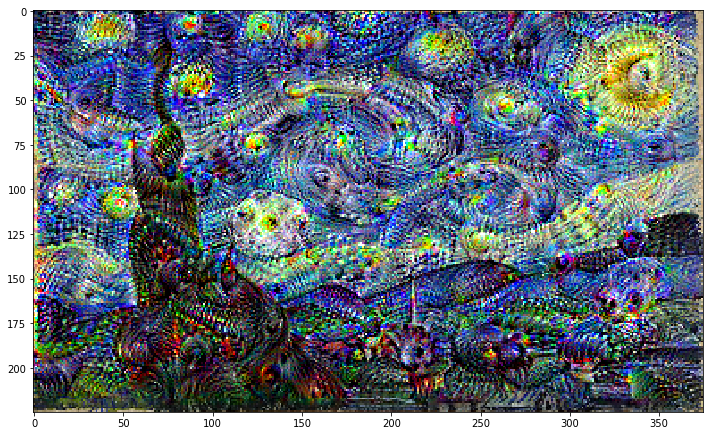

In [26]:
Sample_Image= tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/Colab Notebooks/StaryNight.jpg', target_size = (225, 375))
# Sample_Image= tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/Colab Notebooks/StaryNight.jpg', target_size = (225, 375))

# Sample_Image = np.array(Sample_Image)/255.0
# Sample_Image = tf.keras.preprocessing.image.img_to_array(Sample_Image)
Sample_Image = np.array(Sample_Image)
# Sample_Image = tf.keras.applications.inception_v3.preprocess_input(Sample_Image)
dream_img = run_deep_dream_simple(model=deepdream_model, image=Sample_Image, 
                                  steps=2000, step_size=0.001)

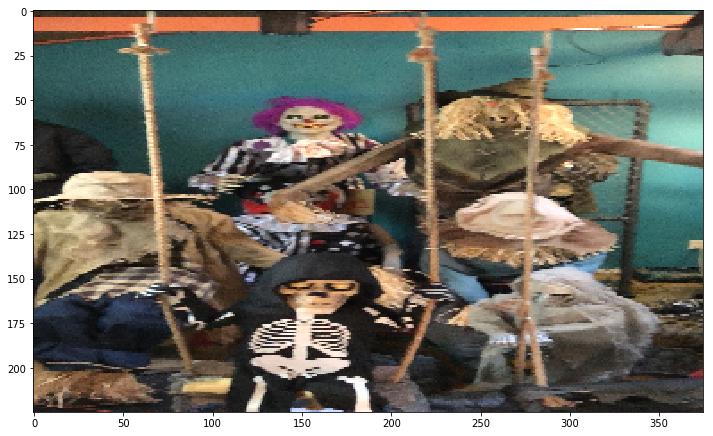

Step 0, loss 0.762312650680542


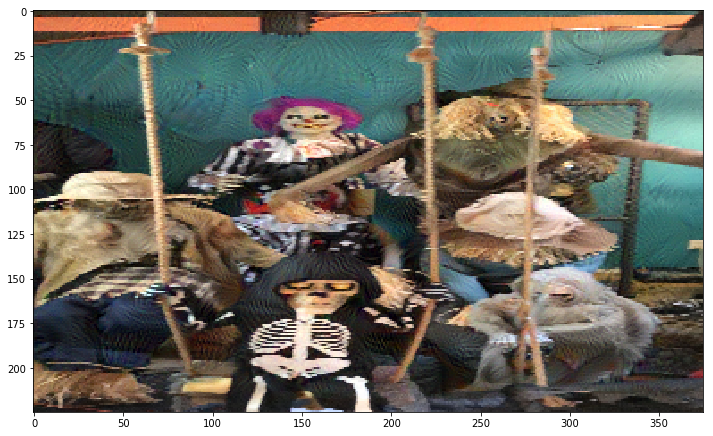

Step 100, loss 1.4805289506912231


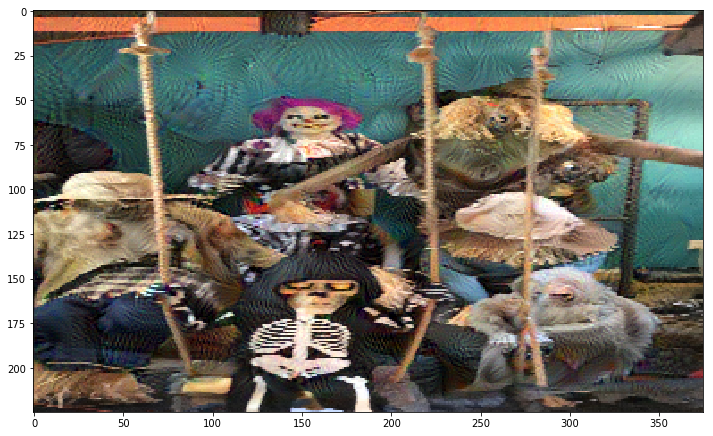

Step 200, loss 1.7153016328811646


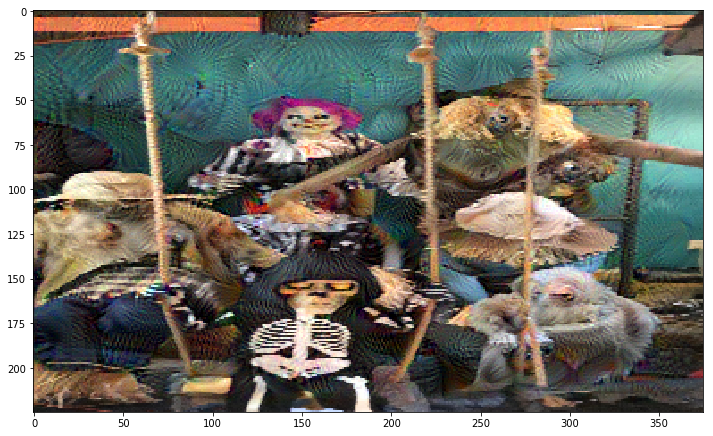

Step 300, loss 1.8638849258422852


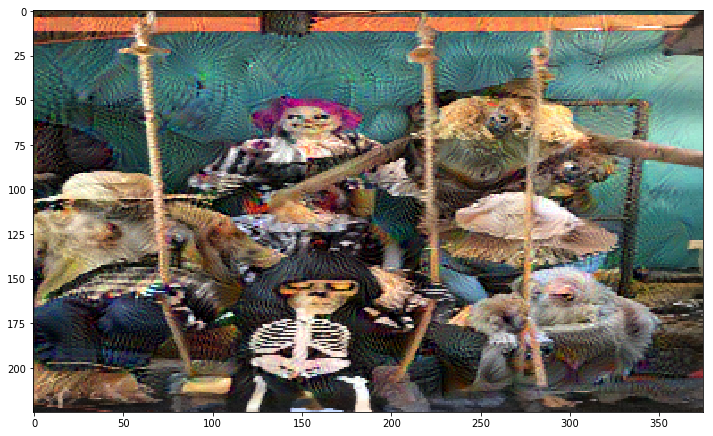

Step 400, loss 1.979835867881775


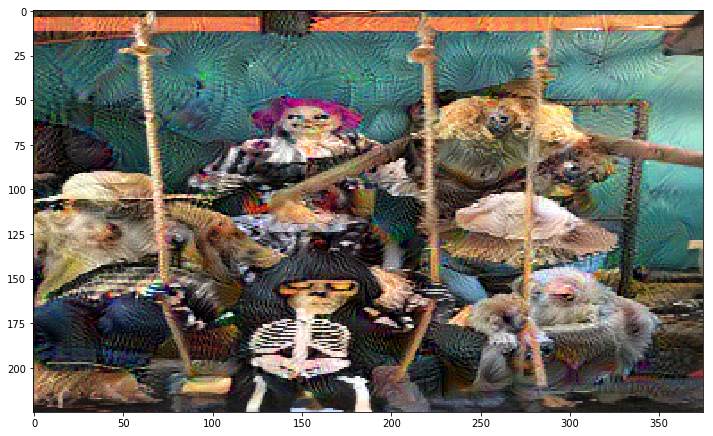

Step 500, loss 2.073326826095581


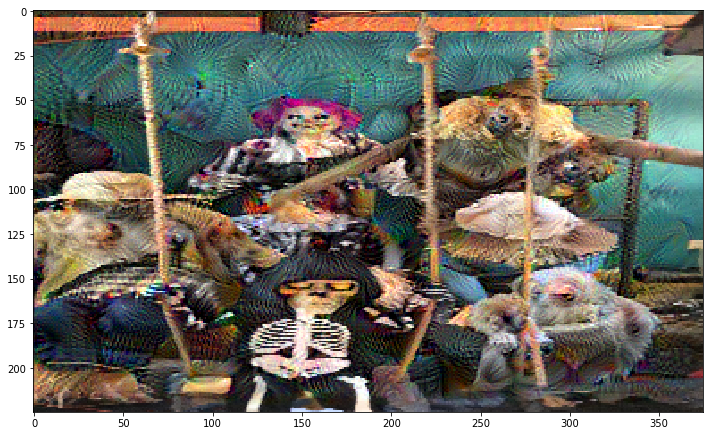

Step 600, loss 2.1495022773742676


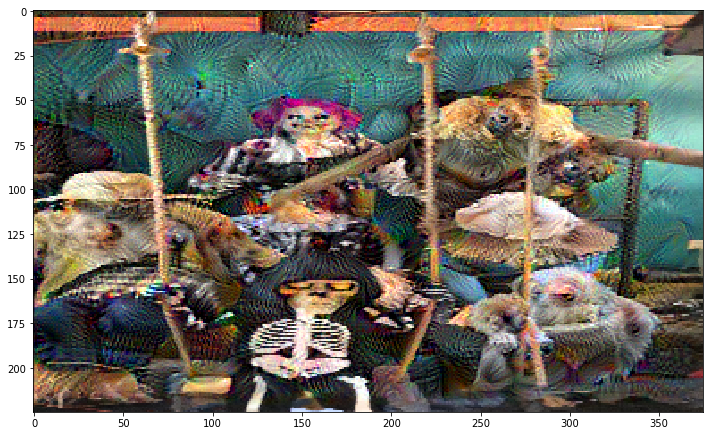

Step 700, loss 2.2143735885620117


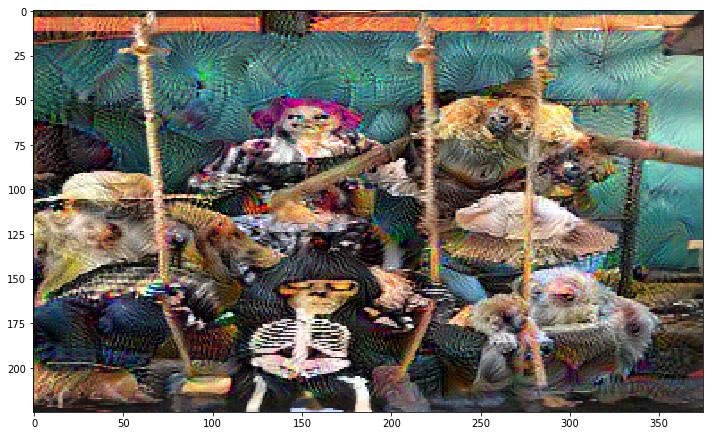

Step 800, loss 2.2714850902557373


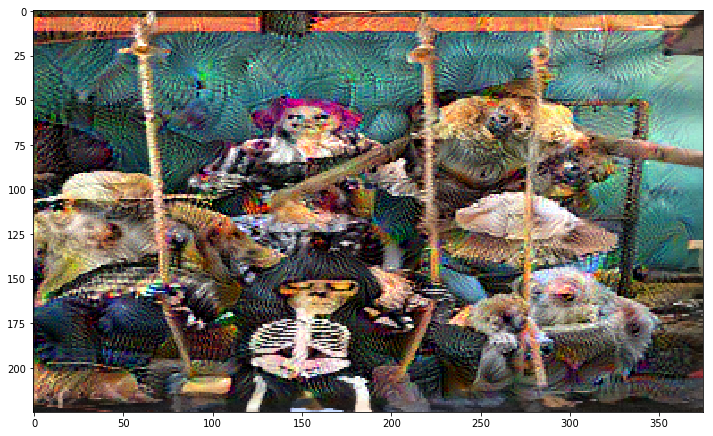

Step 900, loss 2.3224589824676514


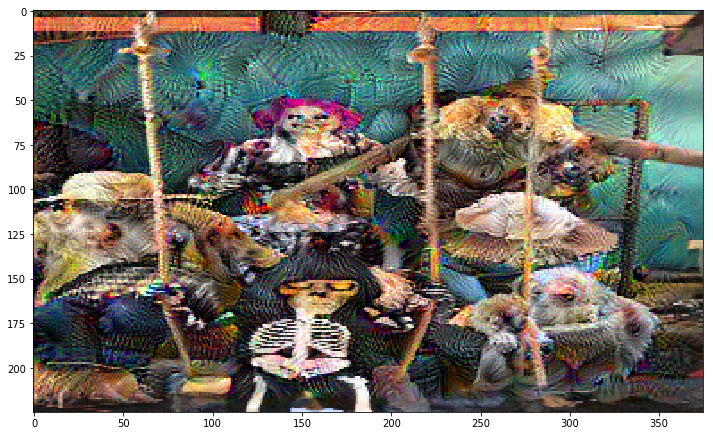

Step 1000, loss 2.3694608211517334


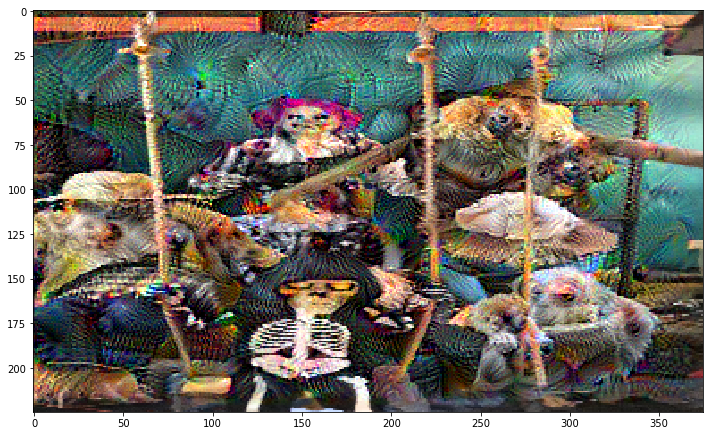

Step 1100, loss 2.4133548736572266


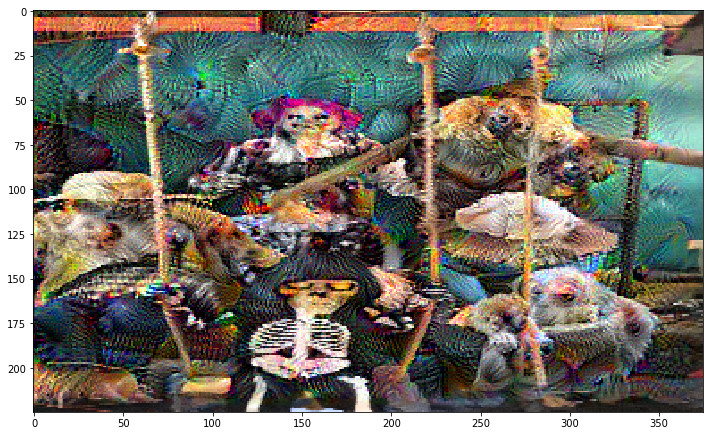

Step 1200, loss 2.4544413089752197


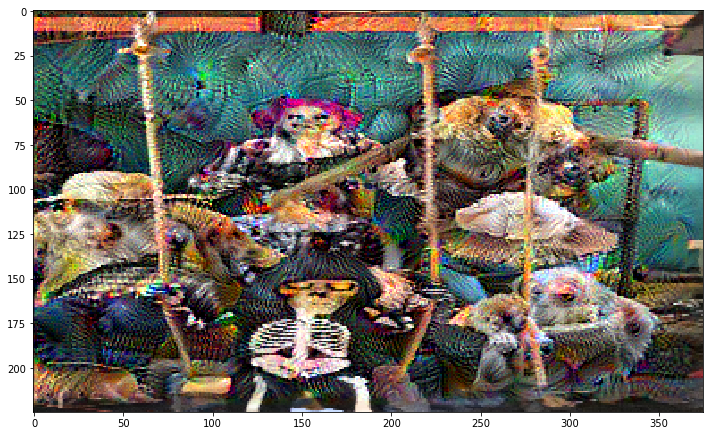

Step 1300, loss 2.4934229850769043


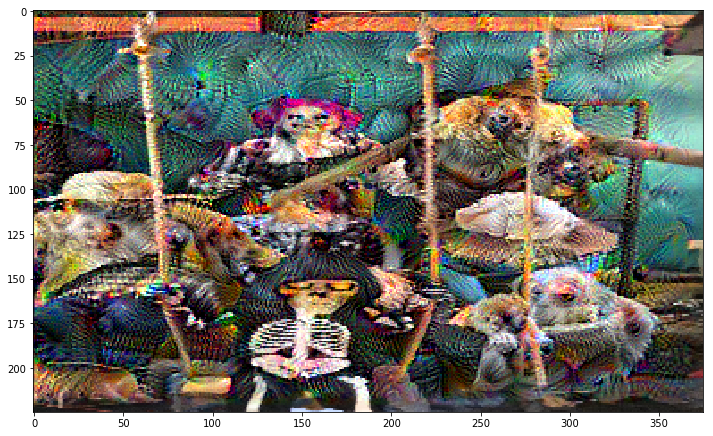

Step 1400, loss 2.53059983253479


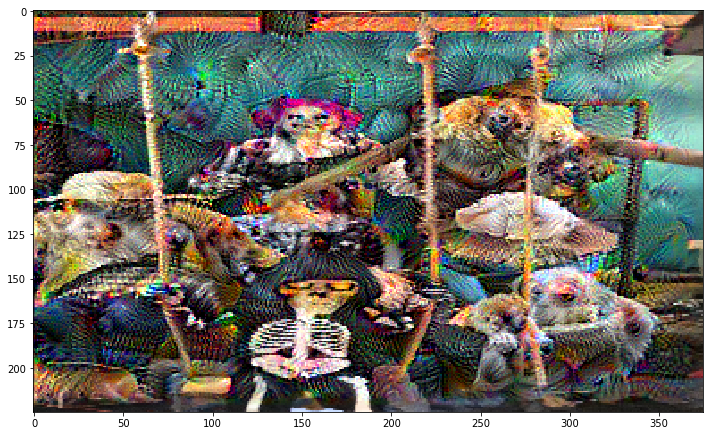

Step 1500, loss 2.565394401550293


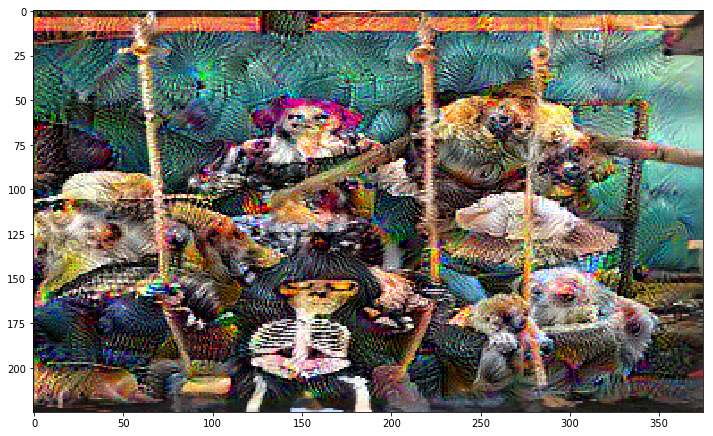

Step 1600, loss 2.5983099937438965


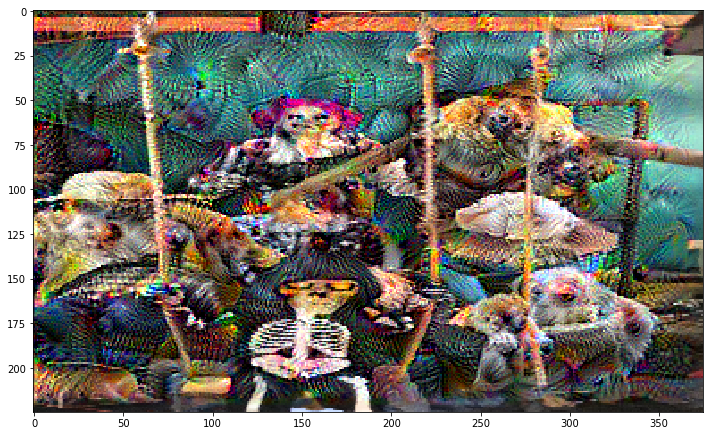

Step 1700, loss 2.6295104026794434


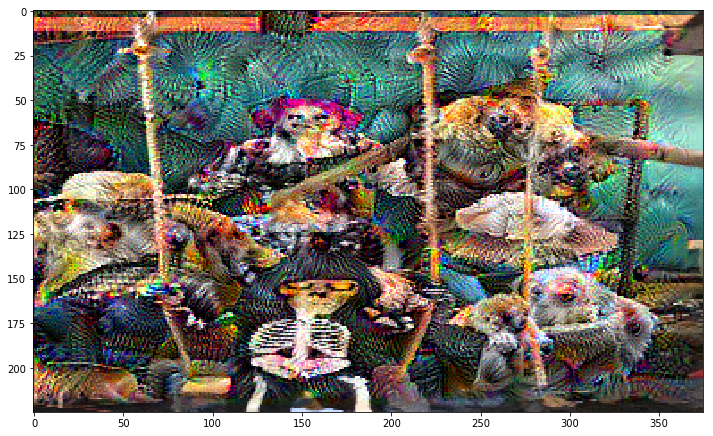

Step 1800, loss 2.659890651702881


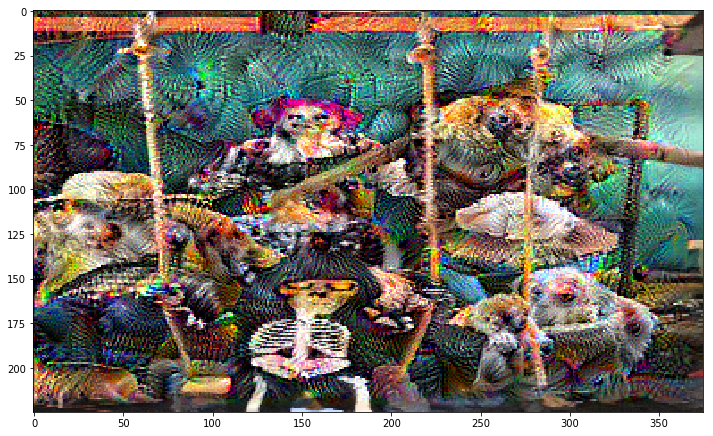

Step 1900, loss 2.6893057823181152


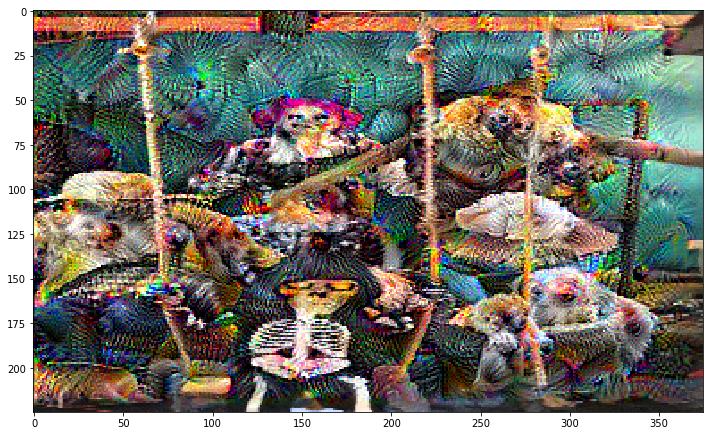

In [28]:
Sample_Image= tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/Colab Notebooks/sample.jpg', target_size = (225, 375))
Sample_Image = np.array(Sample_Image)
dream_img = run_deep_dream_simple(model=deepdream_model, image=Sample_Image, 
                                  steps=2000, step_size=0.001)